In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

import seaborn as sns

import scanpy as sc
import palantir
from fa2 import ForceAtlas2
from sklearn.neighbors import NearestNeighbors
%matplotlib inline


findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [2]:
np.random.seed(12345)
plt.rcParams['figure.figsize'] = [4,4]
sc.set_figure_params(scanpy=True, dpi=100)

# Load Data

In [3]:
adata = sc.read('/data/leslie/gaov/project/synfib_revision/data/forPub/adata_spatial.h5')


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


# Visualize fibroblast state signatures (from scRNAseq data)

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


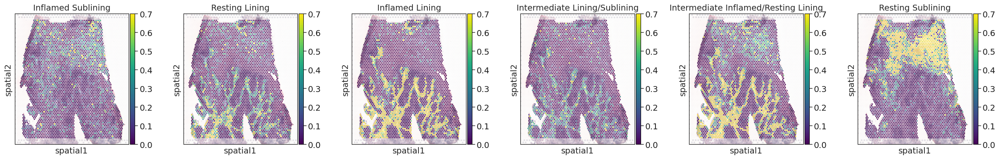

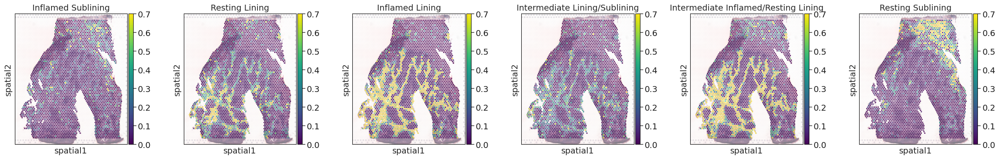

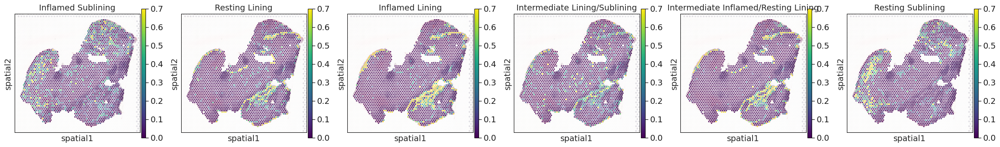

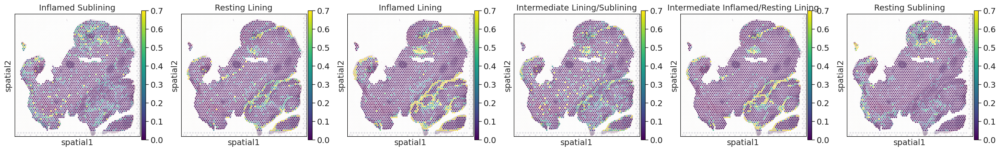

In [5]:
id2state = ['Inflamed Sublining', 'Resting Lining', 'Inflamed Lining', 'Intermediate Lining/Sublining', 'Intermediate Inflamed/Resting Lining', 'Resting Sublining']
for sample_id in ['RA379A','RA379B','RA385A','RA385B']:
    sc.pl.spatial(adata[adata.obs['sample']==sample_id], img_key="hires", library_id=sample_id,
                  color=id2state, alpha_img=0.5, vmax = 0.7, vmin = 0, ncols=6, cmap = 'viridis')

# Visualize cytokine stimulation signatures

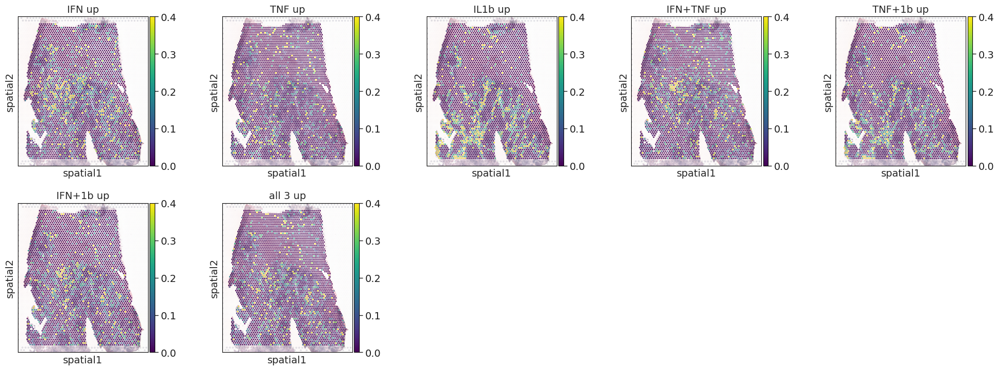

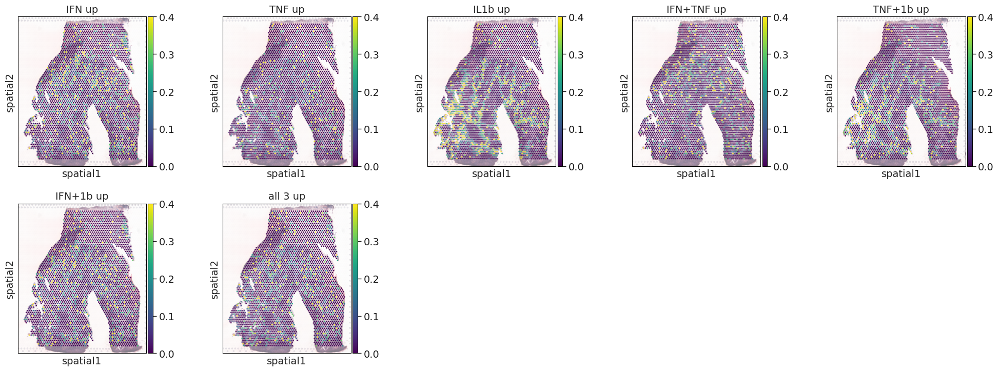

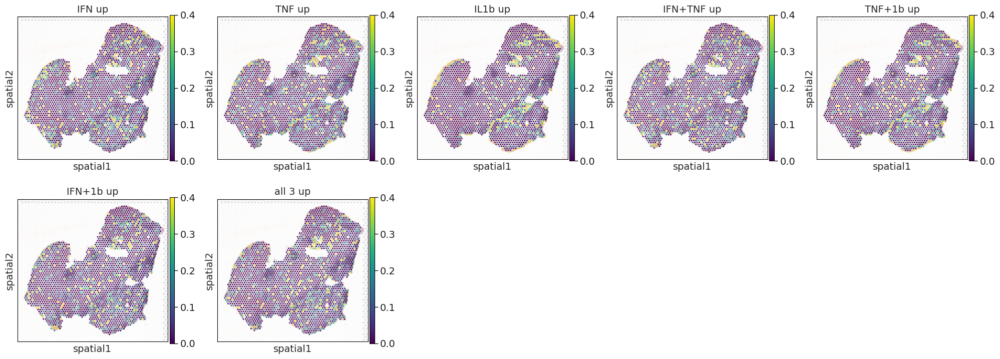

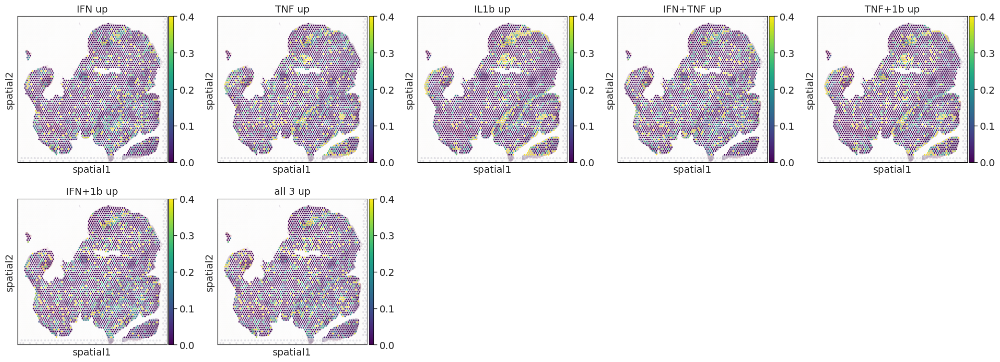

In [6]:
for sample_id in ['RA379A','RA379B','RA385A','RA385B']:
    sc.pl.spatial(adata[adata.obs['sample']==sample_id], img_key="hires", library_id=sample_id,
                  color=['IFN up', 'TNF up', 'IL1b up', 'IFN+TNF up', 'TNF+1b up', 'IFN+1b up', 'all 3 up'],alpha_img=0.5, vmax = 0.4, vmin = 0, ncols=5, 
                 cmap = 'viridis')

# Correlate unsupervised topics with gene signatures across spots

### RA385A only

In [13]:
topic_genes = pd.read_excel('/data/leslie/gaov/project/synfib_multiome/geneset/20221207_topics_ST.xlsx',
                           sheet_name='RA385A only')


In [14]:
for c in topic_genes.columns:
    print(c)
    sc.tl.score_genes(adata, gene_list=list(topic_genes[c]), score_name=c)


macrophage 1
sublining FLS
macrophage 2
endothelial
lining FLS


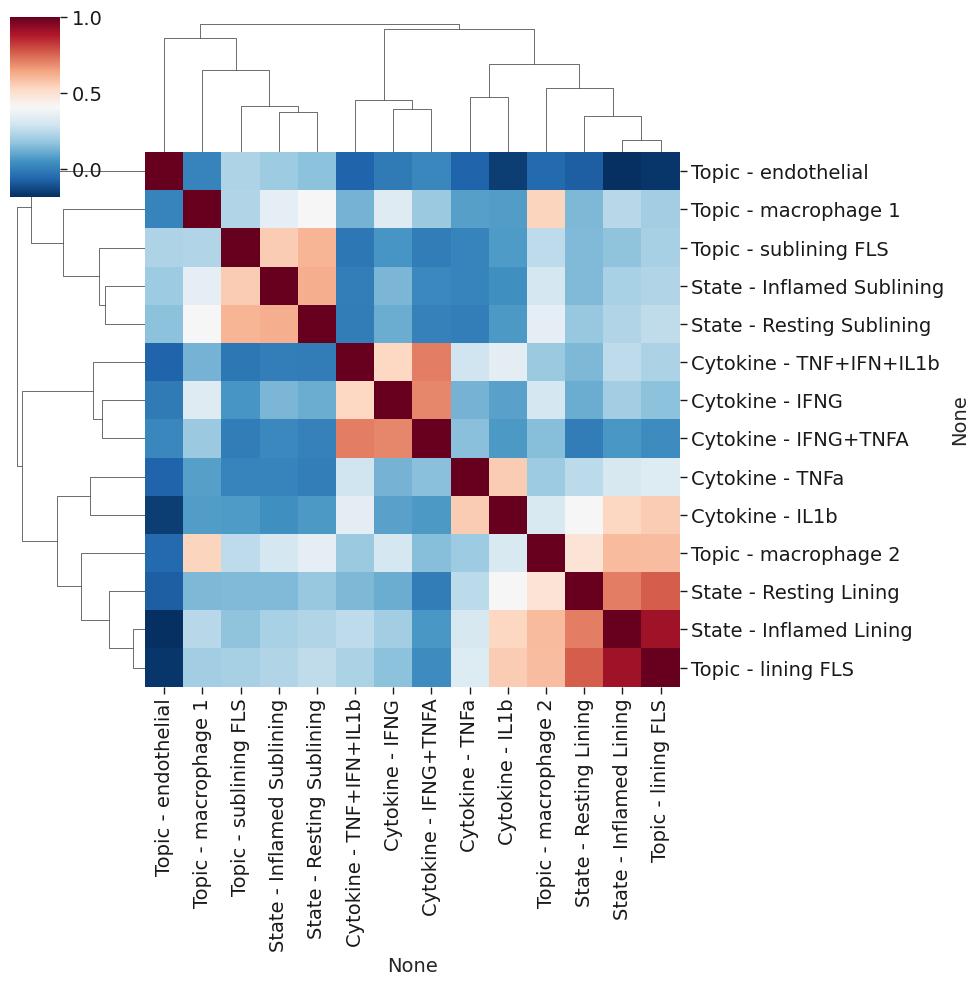

In [15]:
sns.clustermap(pd.DataFrame(np.corrcoef(x = adata[['385' in x for x in adata.obs['sample']]].obs[['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining'] + ['IFN up',
 'TNF up',
 'IL1b up',
 'IFN+TNF up',
 'all 3 up'] + list(topic_genes.keys())].T), 
 index = [['State - {}'.format(s) for s in ['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining']] + ['Cytokine - IFNG', 'Cytokine - TNFa', 'Cytokine - IL1b', 'Cytokine - IFNG+TNFA', 'Cytokine - TNF+IFN+IL1b'] + 
          ['Topic - {}'.format(t) for t in topic_genes.keys()]],
 columns = [['State - {}'.format(s) for s in ['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining']] + 
            ['Cytokine - IFNG', 'Cytokine - TNFa', 'Cytokine - IL1b', 'Cytokine - IFNG+TNFA', 'Cytokine - TNF+IFN+IL1b'] + 
            ['Topic - {}'.format(t) for t in topic_genes.keys()]]), cmap = 'RdBu_r',
               figsize=(10,10)
              )


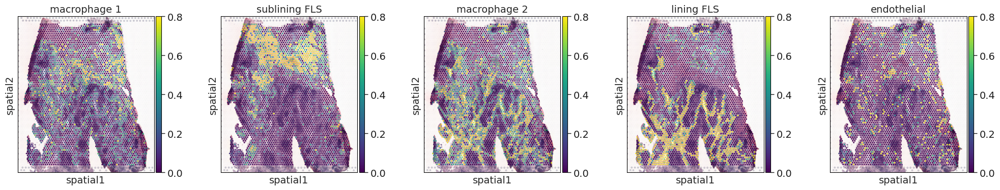

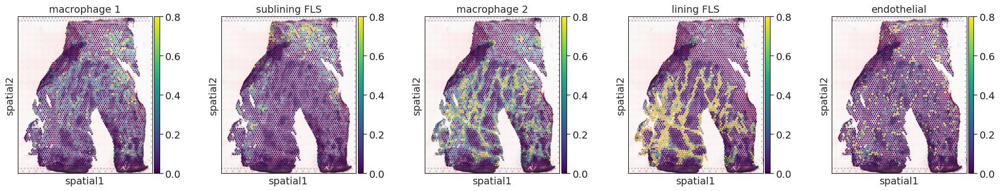

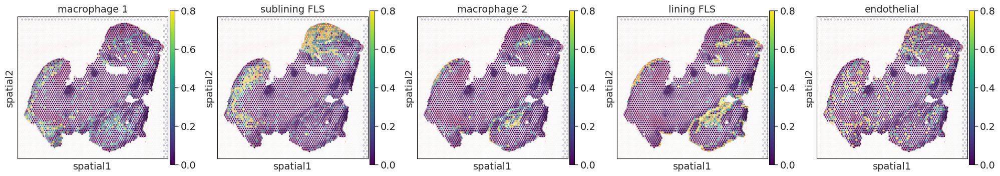

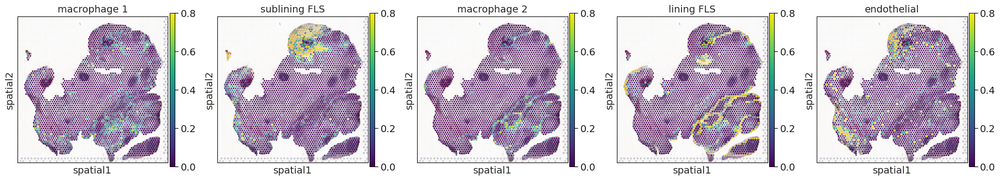

In [18]:
for sample_id in ['RA379A','RA379B','RA385A','RA385B']:
    sc.pl.spatial(adata[adata.obs['sample']==sample_id], img_key="hires", library_id=sample_id,
                  color=['macrophage 1', 'sublining FLS', 'macrophage 2', 'lining FLS', 'endothelial'],
                  alpha_img=0.9, vmax = 0.8, vmin = 0, ncols=5, 
                  cmap = 'viridis')

### RA379A only

In [10]:
topic_genes = pd.read_excel('/data/leslie/gaov/project/synfib_multiome/geneset/20221207_topics_ST.xlsx',
                           sheet_name='RA379A only')


In [11]:
for c in topic_genes.columns:
    print(c)
    sc.tl.score_genes(adata, gene_list=list(topic_genes[c]), score_name=c)


sublining FLS 1


sublining FLS 2


mac + sublining FLS


macrophage 1


lining/sublining FLS


lining FLS 1


lining FLS 2
endothelial


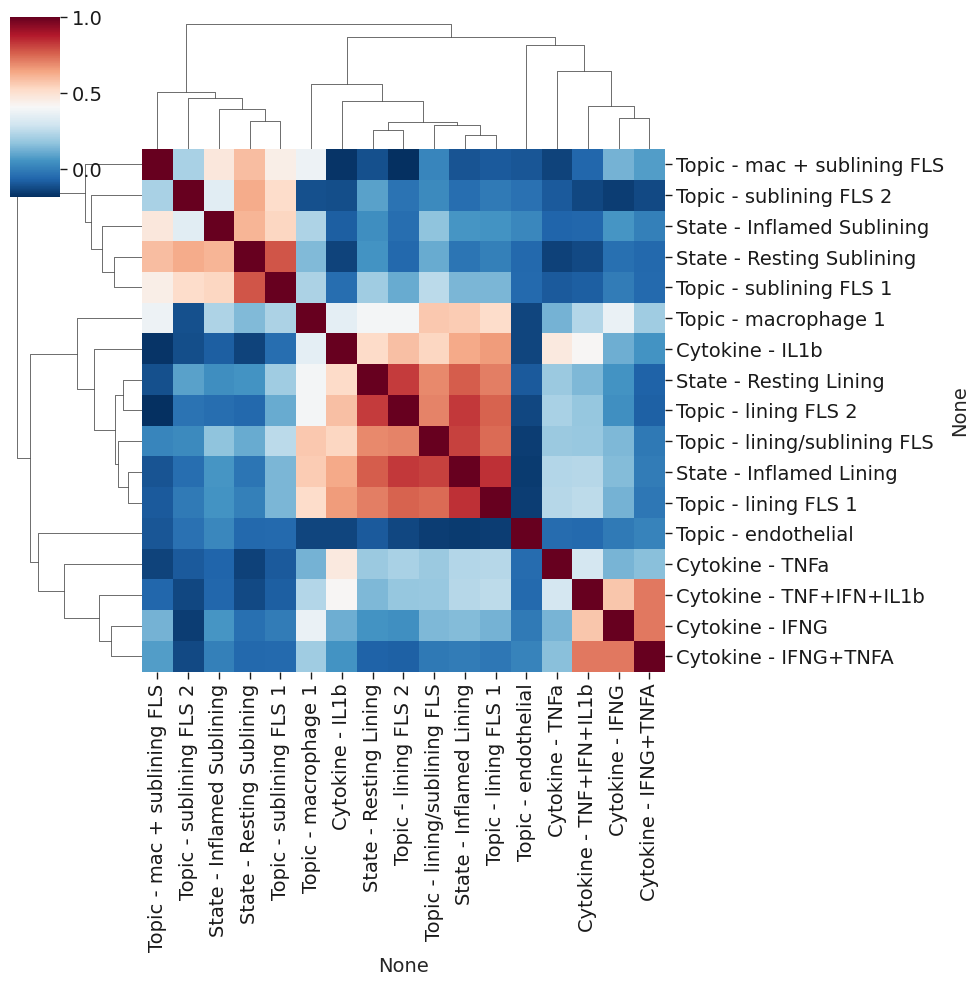

In [12]:
sns.clustermap(pd.DataFrame(np.corrcoef(x = adata[['379' in x for x in adata.obs['sample']]].obs[['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining'] + ['IFN up',
 'TNF up',
 'IL1b up',
 'IFN+TNF up',
#  'TNF+1b up',
#  'IFN+1b up',
 'all 3 up'] + list(topic_genes.keys())].T), 
 index = [['State - {}'.format(s) for s in ['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining']] + ['Cytokine - IFNG', 'Cytokine - TNFa', 'Cytokine - IL1b', 'Cytokine - IFNG+TNFA', 'Cytokine - TNF+IFN+IL1b'] + 
          ['Topic - {}'.format(t) for t in topic_genes.keys()]],
 columns = [['State - {}'.format(s) for s in ['Inflamed Sublining',
 'Resting Lining',
 'Inflamed Lining',
 'Resting Sublining']] + 
            ['Cytokine - IFNG', 'Cytokine - TNFa', 'Cytokine - IL1b', 'Cytokine - IFNG+TNFA', 'Cytokine - TNF+IFN+IL1b'] + 
            ['Topic - {}'.format(t) for t in topic_genes.keys()]]), cmap = 'RdBu_r',
               figsize=(10,10)
              )
